In [12]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from transformers import XLMRobertaTokenizer, XLMRobertaForSequenceClassification
from peft import LoraConfig, get_peft_model, PeftModel, PeftConfig, TaskType

from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, multilabel_confusion_matrix

from bertviz import model_view
from lime.lime_text import LimeTextExplainer

from tqdm import tqdm

# Device setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [1]:
num_labels = 6

# Load the base models
base_model = XLMRobertaForSequenceClassification.from_pretrained(
    "xlm-roberta-large",
    num_labels=num_labels
)

# LoRA config
lora_config = LoraConfig(
    r=8,
    lora_alpha=128,
    target_modules=[
        "query", "key", "value",
        "output.dense",
        "intermediate.dense"
    ],
    lora_dropout=0.1,
    bias="none",
    task_type=TaskType.SEQ_CLS
)

model = get_peft_model(base_model, lora_config)
model = model.to(device)

def print_trainable_parameters(model):
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f"\nTrainable parameters: {trainable:,} / {total:,} ({100 * trainable / total:.2f}%)")
    
def unfreeze_classifier(model):
    for name, param in model.named_parameters():
        if "classifier" in name:
            param.requires_grad = True


# Anslyze the model
print_trainable_parameters(model)

print("\nModel structure with LoRA adapters:\n")
print(model)

# Unfreeze the classifier
unfreeze_classifier(model)
print_trainable_parameters(model)

/home/aviator98/anaconda3/envs/python3.11_env/lib/python3.11/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: '/home/aviator98/anaconda3/envs/python3.11_env/lib/python3.11/site-packages/torchvision/image.so: undefined symbol: _ZN3c1017RegisterOperatorsD1Ev'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(
2025-04-25 11:14:34.830696: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745559874.843453    5248 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745559874.847222    5248 cuda_blas.cc:14


Trainable parameters: 4,594,694 / 564,491,276 (0.81%)

Model structure with LoRA adapters:

PeftModelForSequenceClassification(
  (base_model): LoraModel(
    (model): XLMRobertaForSequenceClassification(
      (roberta): XLMRobertaModel(
        (embeddings): XLMRobertaEmbeddings(
          (word_embeddings): Embedding(250002, 1024, padding_idx=1)
          (position_embeddings): Embedding(514, 1024, padding_idx=1)
          (token_type_embeddings): Embedding(1, 1024)
          (LayerNorm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
          (dropout): Dropout(p=0.1, inplace=False)
        )
        (encoder): XLMRobertaEncoder(
          (layer): ModuleList(
            (0-23): 24 x XLMRobertaLayer(
              (attention): XLMRobertaAttention(
                (self): XLMRobertaSdpaSelfAttention(
                  (query): lora.Linear(
                    (base_layer): Linear(in_features=1024, out_features=1024, bias=True)
                    (lora_dropout): ModuleDic

In [2]:
# Creating the dataset

df = pd.read_csv("data/esp.csv")

X_cols = ['text']
Y_cols = ['anger', 'disgust', 'fear', 'joy', 'sadness', 'surprise']

X = list(df[X_cols].values.flatten())
y = torch.tensor(df[Y_cols].values, dtype=torch.float32)

tokenizer = XLMRobertaTokenizer.from_pretrained("xlm-roberta-base")

# Class to crete the dataset
class EmotionDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len=128):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]

        encoding = self.tokenizer(
            text,
            truncation=True,
            padding='max_length',
            max_length=self.max_len,
            return_tensors='pt'
        )

        return {
            'input_ids': encoding['input_ids'].squeeze(0),
            'attention_mask': encoding['attention_mask'].squeeze(0),
            'labels': label
        }

dataset = EmotionDataset(X, y, tokenizer)

train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

batch_size = 4
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)

In [3]:
model = model.to(device)

criterion = nn.BCEWithLogitsLoss()
optimizer = optim.AdamW(model.parameters(), lr=2e-5)


Epoch 1/40


Training:   0%|          | 0/399 [00:00<?, ?it/s]

Epoch 1 Summary: Train Loss = 0.5449, Acc = 0.0013, F1 = 0.0387 | Val Loss = 0.5163, Acc = 0.0000, F1 = 0.0000

Epoch 2/40


Epoch 2 Summary: Train Loss = 0.4416, Acc = 0.2180, F1 = 0.4291 | Val Loss = 0.2818, Acc = 0.5750, F1 = 0.7608

Epoch 3/40


Epoch 3 Summary: Train Loss = 0.2890, Acc = 0.5351, F1 = 0.7455 | Val Loss = 0.2336, Acc = 0.6150, F1 = 0.7974

Epoch 4/40


Epoch 4 Summary: Train Loss = 0.2469, Acc = 0.6134, F1 = 0.7986 | Val Loss = 0.2336, Acc = 0.6525, F1 = 0.8152
No improvement in val loss for 1 epoch(s).

Epoch 5/40


Epoch 5 Summary: Train Loss = 0.2194, Acc = 0.6310, F1 = 0.8225 | Val Loss = 0.2256, Acc = 0.6525, F1 = 0.8163

Epoch 6/40


Epoch 6 Summary: Train Loss = 0.2036, Acc = 0.6472, F1 = 0.8326 | Val Loss = 0.2207, Acc = 0.6525, F1 = 0.8205

Epoch 7/40


Epoch 7 Summary: Train Loss = 0.1823, Acc = 0.6842, F1 = 0.8546 | Val Loss = 0.2195, Acc = 0.6400, F1 = 0.8118

Epoch 8/40


Epoch 8 Summary: Train Loss = 0.1677, Acc = 0.6980, F1 = 0.8619 | Val Loss = 0.2240, Acc = 0.6600, F1 = 0.8291
No improvement in val loss for 1 epoch(s).

Epoch 9/40


Epoch 9 Summary: Train Loss = 0.1547, Acc = 0.7224, F1 = 0.8818 | Val Loss = 0.2326, Acc = 0.6500, F1 = 0.8199
No improvement in val loss for 2 epoch(s).

Epoch 10/40


Epoch 10 Summary: Train Loss = 0.1437, Acc = 0.7287, F1 = 0.8847 | Val Loss = 0.2160, Acc = 0.6475, F1 = 0.8270

Epoch 11/40


Epoch 11 Summary: Train Loss = 0.1268, Acc = 0.7650, F1 = 0.9022 | Val Loss = 0.2233, Acc = 0.6375, F1 = 0.8180
No improvement in val loss for 1 epoch(s).

Epoch 12/40


Epoch 12 Summary: Train Loss = 0.1230, Acc = 0.7625, F1 = 0.9046 | Val Loss = 0.2397, Acc = 0.6200, F1 = 0.8139
No improvement in val loss for 2 epoch(s).

Epoch 13/40


Epoch 13 Summary: Train Loss = 0.1104, Acc = 0.7914, F1 = 0.9129 | Val Loss = 0.2385, Acc = 0.6425, F1 = 0.8235
No improvement in val loss for 3 epoch(s).
Early stopping triggered after 3 consecutive non-improving epochs.


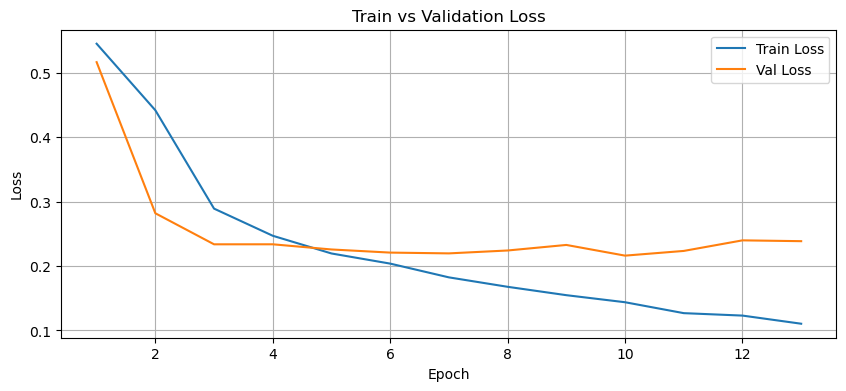

In [4]:
# Training config
epochs = 40
patience = 3
best_val_loss = float('inf')
epochs_without_improvement = 0

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
train_f1s, val_f1s = [], []

for epoch in range(epochs):
    print(f"\nEpoch {epoch+1}/{epochs}")
    
    # Training
    model.train()
    running_loss = 0
    all_preds, all_labels = [], []

    train_loop = tqdm(train_loader, desc="Training", leave=False)
    for batch in train_loop:
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        optimizer.zero_grad()
        outputs = model(input_ids=input_ids, attention_mask=attention_mask).logits
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        preds = torch.sigmoid(outputs).detach().cpu().numpy()
        all_preds.extend((preds > 0.5).astype(int))
        all_labels.extend(labels.cpu().numpy())

        train_loop.set_postfix(loss=loss.item())

    avg_train_loss = running_loss / len(train_loader)
    train_acc = accuracy_score(all_labels, all_preds)
    train_f1 = f1_score(all_labels, all_preds, average='micro')

    train_losses.append(avg_train_loss)
    train_accuracies.append(train_acc)
    train_f1s.append(train_f1)

    # Validation
    model.eval()
    val_running_loss = 0
    val_preds, val_labels = [], []

    val_loop = tqdm(val_loader, desc="Validation", leave=False)
    with torch.no_grad():
        for batch in val_loop:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)

            outputs = model(input_ids=input_ids, attention_mask=attention_mask).logits
            loss = criterion(outputs, labels)
            val_running_loss += loss.item()

            preds = torch.sigmoid(outputs).cpu().numpy()
            val_preds.extend((preds > 0.5).astype(int))
            val_labels.extend(labels.cpu().numpy())

            val_loop.set_postfix(loss=loss.item())

    avg_val_loss = val_running_loss / len(val_loader)
    val_acc = accuracy_score(val_labels, val_preds)
    val_f1 = f1_score(val_labels, val_preds, average='micro')

    val_losses.append(avg_val_loss)
    val_accuracies.append(val_acc)
    val_f1s.append(val_f1)

    print(f"Epoch {epoch+1} Summary:"
          f" Train Loss = {avg_train_loss:.4f}, Acc = {train_acc:.4f}, F1 = {train_f1:.4f} |"
          f" Val Loss = {avg_val_loss:.4f}, Acc = {val_acc:.4f}, F1 = {val_f1:.4f}")

    # Early Stopping Check
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        epochs_without_improvement = 0
    else:
        epochs_without_improvement += 1
        print(f"No improvement in val loss for {epochs_without_improvement} epoch(s).")
        if epochs_without_improvement >= patience:
            print(f"Early stopping triggered after {patience} consecutive non-improving epochs.")
            break

# Plotting losses
plt.figure(figsize=(10, 4))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Train vs Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

In [5]:
# Creating the test dataset

test_df = pd.read_csv("data/esp_test.csv")
X_test = list(test_df["text"].values)
y_test = test_df[["anger", "disgust", "fear", "joy", "sadness", "surprise"]].values

# Class to crete the dataset
class EmotionDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len=128):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]

        encoding = self.tokenizer(
            text,
            truncation=True,
            padding='max_length',
            max_length=self.max_len,
            return_tensors='pt'
        )

        return {
            'input_ids': encoding['input_ids'].squeeze(0),
            'attention_mask': encoding['attention_mask'].squeeze(0),
            'labels': label
        }


y_test_tensor = torch.tensor(y_test, dtype=torch.float32)
test_dataset = EmotionDataset(X_test, y_test_tensor, tokenizer)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

In [8]:
# Evaluating the model

model.eval()

all_preds = []
all_labels = []

with torch.no_grad():
    for batch in test_loader:
        input_ids = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        labels = batch["labels"].to(device)

        outputs = model(input_ids=input_ids, attention_mask=attention_mask).logits
        preds = torch.sigmoid(outputs).cpu().numpy()
        preds = (preds > 0.5).astype(int)

        all_preds.extend(preds)
        all_labels.extend(labels.cpu().numpy())

y_true = np.array(all_labels)
y_pred = np.array(all_preds)

f1 = f1_score(y_true, y_pred, average='macro')
acc = accuracy_score(y_true, y_pred)
report = classification_report(y_true, y_pred, target_names=["anger", "disgust", "fear", "joy", "sadness", "surprise"])
conf_matrix = multilabel_confusion_matrix(y_true, y_pred)

precision = precision_score(y_true, y_pred, average='macro', zero_division=0)
recall = recall_score(y_true, y_pred, average='macro', zero_division=0)

print("F1 Score (macro):", f1)
print("Recall Score (macro):", recall)
print("Precision Score (macro):", precision)
print("Accuracy:", acc)
print("\nClassification Report:\n", report)
print("\nConfusion Matrices:\n", conf_matrix)

F1 Score (macro): 0.7739468946378002
Recall Score (macro): 0.7773111734841383
Precision Score (macro): 0.7752111475747206
Accuracy: 0.5728613569321533

Classification Report:
               precision    recall  f1-score   support

       anger       0.75      0.66      0.70       403
     disgust       0.80      0.70      0.75       556
        fear       0.82      0.81      0.82       200
         joy       0.85      0.84      0.85       541
     sadness       0.77      0.85      0.81       246
    surprise       0.66      0.80      0.73       394

   micro avg       0.77      0.77      0.77      2340
   macro avg       0.78      0.78      0.77      2340
weighted avg       0.78      0.77      0.77      2340
 samples avg       0.80      0.81      0.78      2340


Confusion Matrices:
 [[[1201   91]
  [ 136  267]]

 [[1040   99]
  [ 166  390]]

 [[1459   36]
  [  37  163]]

 [[1076   78]
  [  88  453]]

 [[1388   61]
  [  38  208]]

 [[1140  161]
  [  78  316]]]


/home/aviator98/anaconda3/envs/python3.11_env/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [9]:
# Save the trained LoRA model

model.save_pretrained("checkpoints/xlm-roberta-lora-large-r8-qv+")
tokenizer.save_pretrained("checkpoints/xlm-roberta-lora-large-r8-qv+")

('checkpoints/xlm-roberta-lora-large-r8-qv+/tokenizer_config.json',
 'checkpoints/xlm-roberta-lora-large-r8-qv+/special_tokens_map.json',
 'checkpoints/xlm-roberta-lora-large-r8-qv+/sentencepiece.bpe.model',
 'checkpoints/xlm-roberta-lora-large-r8-qv+/added_tokens.json')

In [ ]:
# Load the model

peft_config = PeftConfig.from_pretrained("checkpoints/xlm-roberta-lora-large-r8-qv+")

base_model = XLMRobertaForSequenceClassification.from_pretrained(peft_config.base_model_name_or_path, num_labels=6)
tokenizer = XLMRobertaTokenizer.from_pretrained("checkpoints/xlm-roberta-lora-large-r8-qv+")

model_load = PeftModel.from_pretrained(base_model, "checkpoints/xlm-roberta-lora-large-r8-qv+")
model_load.to(device)
model_load.eval()

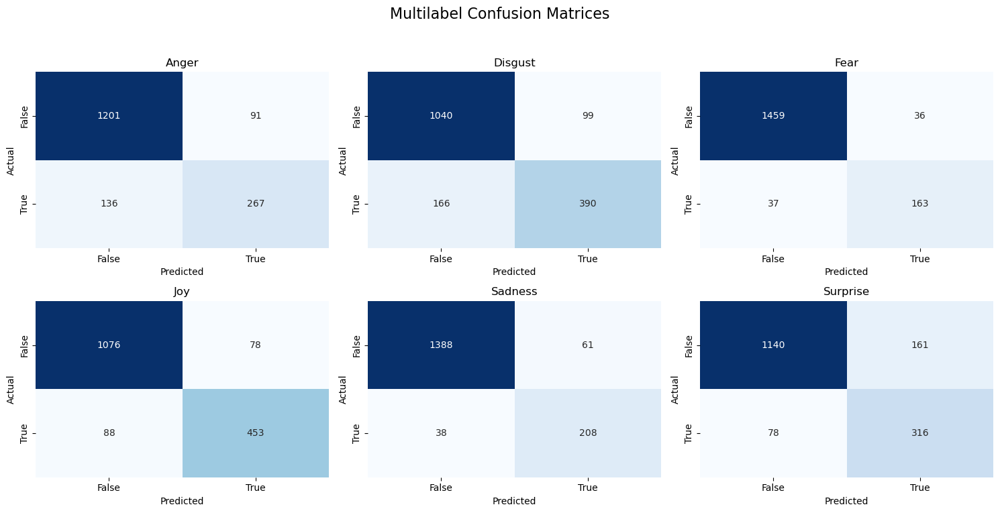

In [7]:
# Confusion Matrix

fig, axes = plt.subplots(2, 3, figsize=(15, 8))
fig.suptitle('Multilabel Confusion Matrices', fontsize=16)

emotion_labels = ["Anger", "Disgust", "Fear", "Joy", "Sadness", "Surprise"]

for idx, ax in enumerate(axes.flat):
    sns.heatmap(conf_matrix[idx], annot=True, fmt='d', cmap='Blues', cbar=False, ax=ax)
    ax.set_title(emotion_labels[idx])
    ax.set_xlabel('Predicted')
    ax.set_ylabel('Actual')
    ax.set_xticklabels(['False', 'True'])
    ax.set_yticklabels(['False', 'True'])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

## Explainability

In [10]:
def visualize_lora_attention(sentence: str, model_path: str = "checkpoints/xlm-roberta-lora-large-r8-qv+", device: str = "cuda" if torch.cuda.is_available() else "cpu"):
    # Load the model
    peft_config = PeftConfig.from_pretrained(model_path)

    base_model = XLMRobertaForSequenceClassification.from_pretrained(peft_config.base_model_name_or_path, num_labels=6)
    tokenizer = XLMRobertaTokenizer.from_pretrained(model_path)

    model_load = PeftModel.from_pretrained(base_model, model_path)
    model_load.to(device)
    model_load.eval()

    # Obtain the token inputs
    inputs = tokenizer(sentence, return_tensors='pt', truncation=True, padding=True).to(device)

    # Pass into model
    with torch.no_grad():
        outputs = model_load(**inputs, output_attentions=True)
    attention = outputs.attentions
    tokens = tokenizer.convert_ids_to_tokens(inputs["input_ids"][0])

    # Get the probabilities
    probs = torch.sigmoid(outputs.logits).squeeze().cpu().numpy()
    emotions = ["anger", "disgust", "fear", "joy", "sadness", "surprise"]
    for emotion, prob in zip(emotions, probs):
        print(f"{emotion}: {prob:.4f}")

    model_view(attention, tokens)

In [11]:
visualize_lora_attention("No estoy feliz")

Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-large and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
XLMRobertaSdpaSelfAttention is used but `torch.nn.functional.scaled_dot_product_attention` does not support non-absolute `position_embedding_type` or `output_attentions=True` or `head_mask`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


anger: 0.0133
disgust: 0.0191
fear: 0.0032
joy: 0.0790
sadness: 0.9981
surprise: 0.0065


<IPython.core.display.Javascript object>

In [2]:
class_names = ["anger", "disgust", "fear", "joy", "sadness", "surprise"]

def predict_proba(texts, batch_size=8):
    all_probs = []
    model_load.eval()
    with torch.no_grad():
        for i in range(0, len(texts), batch_size):
            batch = texts[i:i+batch_size]
            inputs = tokenizer(batch, padding=True, truncation=True, return_tensors="pt", max_length=128).to(device)
            outputs = model_load(**inputs)
            logits = outputs.logits
            probs = torch.sigmoid(logits)
            all_probs.append(probs.cpu())
    return torch.cat(all_probs, dim=0).numpy()

In [5]:
# Load the model

peft_config = PeftConfig.from_pretrained("checkpoints/xlm-roberta-lora-large-r8-qv+")

base_model = XLMRobertaForSequenceClassification.from_pretrained(peft_config.base_model_name_or_path, num_labels=6)
tokenizer = XLMRobertaTokenizer.from_pretrained("checkpoints/xlm-roberta-lora-large-r8-qv+")

model_load = PeftModel.from_pretrained(base_model, "checkpoints/xlm-roberta-lora-large-r8-qv+")
model_load.to(device)
model_load.eval()

Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-large and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


PeftModelForSequenceClassification(
  (base_model): LoraModel(
    (model): XLMRobertaForSequenceClassification(
      (roberta): XLMRobertaModel(
        (embeddings): XLMRobertaEmbeddings(
          (word_embeddings): Embedding(250002, 1024, padding_idx=1)
          (position_embeddings): Embedding(514, 1024, padding_idx=1)
          (token_type_embeddings): Embedding(1, 1024)
          (LayerNorm): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
          (dropout): Dropout(p=0.1, inplace=False)
        )
        (encoder): XLMRobertaEncoder(
          (layer): ModuleList(
            (0-23): 24 x XLMRobertaLayer(
              (attention): XLMRobertaAttention(
                (self): XLMRobertaSdpaSelfAttention(
                  (query): lora.Linear(
                    (base_layer): Linear(in_features=1024, out_features=1024, bias=True)
                    (lora_dropout): ModuleDict(
                      (default): Dropout(p=0.1, inplace=False)
                    )
     

In [6]:
from lime.lime_text import LimeTextExplainer

class_names = ['anger', 'disgust', 'fear', 'joy', 'sadness', 'surprise']
explainer = LimeTextExplainer(class_names=class_names)

# sample sentences with theier class types (to print from LIME)
test_cases = [
    ("Estoy muy feliz de verte.", 3),
    ("Me siento profundamente triste.", 4),
    ("Esto me da miedo.", 2),
    ("¡Qué asco da esa comida!", 1),
    ("Me enoja lo que hicieron.", 0),
    ("¡Qué sorpresa tan agradable!", 5),
]

for text, label_index in test_cases:
    exp = explainer.explain_instance(
        text_instance=text,
        classifier_fn=predict_proba,
        num_features=10,
        labels=[label_index]
    )
    print(f"--- Explanation for: '{text}' (Class: {class_names[label_index]}) ---")
    exp.show_in_notebook(text=True, labels=[label_index])

--- Explanation for: 'Estoy muy feliz de verte.' (Class: joy) ---


--- Explanation for: 'Me siento profundamente triste.' (Class: sadness) ---


--- Explanation for: 'Esto me da miedo.' (Class: fear) ---


--- Explanation for: '¡Qué asco da esa comida!' (Class: disgust) ---


--- Explanation for: 'Me enoja lo que hicieron.' (Class: anger) ---


--- Explanation for: '¡Qué sorpresa tan agradable!' (Class: surprise) ---


In [7]:
from lime.lime_text import LimeTextExplainer

class_names = ['anger', 'disgust', 'fear', 'joy', 'sadness', 'surprise']
explainer = LimeTextExplainer(class_names=class_names)

# sample sentences with theier class types (to print from LIME)
test_cases = [
    ("No estoy feliz", 3)
]

for text, label_index in test_cases:
    exp = explainer.explain_instance(
        text_instance=text,
        classifier_fn=predict_proba,
        num_features=10,
        labels=[label_index]
    )
    print(f"--- Explanation for: '{text}' (Class: {class_names[label_index]}) ---")
    exp.show_in_notebook(text=True, labels=[label_index])


--- Explanation for: 'No estoy feliz' (Class: joy) ---


In [8]:
from lime.lime_text import LimeTextExplainer

class_names = ['anger', 'disgust', 'fear', 'joy', 'sadness', 'surprise']
explainer = LimeTextExplainer(class_names=class_names)

# sample sentences with theier class types (to print from LIME)
test_cases = [
    ("Aunque hablaba en voz baja, sus cejas fruncidas y los golpes en la mesa mostraban claramente su enojo", 0)
]

for text, label_index in test_cases:
    exp = explainer.explain_instance(
        text_instance=text,
        classifier_fn=predict_proba,
        num_features=10,
        labels=[label_index]
    )
    print(f"--- Explanation for: '{text}' (Class: {class_names[label_index]}) ---")
    exp.show_in_notebook(text=True, labels=[label_index])


--- Explanation for: 'Aunque hablaba en voz baja, sus cejas fruncidas y los golpes en la mesa mostraban claramente su enojo' (Class: anger) ---


In [9]:
from lime.lime_text import LimeTextExplainer

class_names = ['anger', 'disgust', 'fear', 'joy', 'sadness', 'surprise']
explainer = LimeTextExplainer(class_names=class_names)

# sample sentences with theier class types (to print from LIME)
test_cases = [
    ("No estaba triste", 4),
    ("Se reía mientras las lágrimas caían por su rostro.", 3),
    ("Oh, claro, porque caminar solo en un callejón oscuro es la mejor idea del mundo.", 2)
]

for text, label_index in test_cases:
    exp = explainer.explain_instance(
        text_instance=text,
        classifier_fn=predict_proba,
        num_features=10,
        labels=[label_index]
    )
    print(f"--- Explanation for: '{text}' (Class: {class_names[label_index]}) ---")
    exp.show_in_notebook(text=True, labels=[label_index])


--- Explanation for: 'No estaba triste' (Class: sadness) ---


--- Explanation for: 'Se reía mientras las lágrimas caían por su rostro.' (Class: joy) ---


--- Explanation for: 'Oh, claro, porque caminar solo en un callejón oscuro es la mejor idea del mundo.' (Class: fear) ---
